As a first step we import the necessary packages. If any need installing you can use pipinstall

In [88]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import kmapper as km
import pyballmapper as pbm
import statistics
import seaborn as sb

We will also be working with the color options in this notebook so let us import two additional elements

In [148]:
from matplotlib.colors import ListedColormap
from matplotlib import colormaps as cm

We read in the shape file. Note that you should have all 5 of the geography files in your folder and not just the .shp file

In [30]:
gb_shape = gpd.read_file('Westminster_Parliamentary_Constituencies__December_2019__Boundaries_UK_BFE.shp')

We can plot the map without any colours to show that we do have the expected format

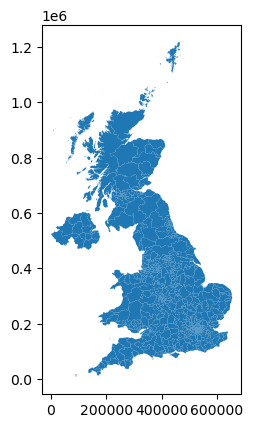

In [149]:
gb_shape.plot(); plt.show()

Next let us read in the ukpoliticsextend.csv file which contains all of the information about the constituencies and election results

In [73]:
data = pd.read_csv("ukpoliticsextend.csv")

Using the .head() function we check that the data is as expected

In [74]:
data.head()

,pcon19cd,ConstituencyName,Con19,Lab19,Con17,Lab17,Con15,Lab15,Leave,Remain,...,qu1,qu2,qu3,de1,de2,de3,ag1,ag2,ag3,ag4
0,W07000049,Aberavon,20.627888,53.826192,17.737766,68.119514,11.870698,48.903975,60.124484,39.875516,...,47.916552,20.860191,27.263879,32.230740,29.679023,38.090238,20.345365,8.281796,46.562231,24.810609
1,W07000058,Aberconwy,46.091323,39.708144,44.594090,42.618974,41.505241,28.240679,52.197117,47.802883,...,36.818422,20.308440,38.269779,40.875711,34.258528,24.865761,18.546486,7.287069,42.082779,32.083666
2,S14000001,Aberdeen North,20.140058,13.201294,22.692276,30.010610,12.072105,25.940004,43.092209,56.907791,...,45.312719,16.569210,38.118071,40.373828,33.189665,26.436508,15.902021,18.484958,47.659903,17.953118
3,S14000002,Aberdeen South,35.930584,8.400894,42.132470,20.549300,22.835781,26.757430,32.143105,67.856895,...,36.386241,13.483781,50.129978,51.914644,30.473801,17.611556,16.572422,11.518611,51.463030,20.445937
4,S14000058,West Aberdeenshire and Kincardine,42.650670,4.557128,47.852785,11.052785,28.835423,4.505761,38.519483,61.480517,...,41.804619,14.400195,43.795186,53.012762,31.304184,15.683054,22.106640,6.804056,48.692618,22.396685


The first constituency is Aberavon in which Labour hold a large majority. This is correct and so we may have some confidence that the data has been read in correctly.

The next step is the merge with the map

In [209]:
uk_results = gb_shape.merge(data, on='pcon19cd')

Again we may use the .head() function to verify that the correct data has been loaded. Notice that the first consituency is no longer Aberavon as it has a W code. Instead the first constituency is Aldershot with an E code. Aldershot was 2nd in the original results file

In [66]:
uk_results.head()

,pcon19cd,pcon19nm,bng_e,bng_n,long,lat,objectid_1,st_lengths,st_areasha,GlobalID,...,qu1,qu2,qu3,de1,de2,de3,ag1,ag2,ag3,ag4
0,E14000530,Aldershot,484884,155126,-0.78410,51.288952,1,42197.661729,5.297816e+07,5cd0ebef-55fa-4715-8413-b6029fb4092c,...,34.870504,20.866194,37.509783,47.943774,32.837418,19.218808,22.737245,9.406093,50.058698,17.797964
1,E14000531,Aldridge-Brownhills,404723,302568,-1.93166,52.620869,2,38590.177955,4.401655e+07,ca9e4e30-a733-4f91-b176-147692614cfb,...,43.452663,19.807747,32.209490,39.975178,33.062364,26.962457,20.284771,7.325850,44.056435,28.332944
2,E14000532,Altrincham and Sale West,374132,389051,-2.39049,53.397659,3,47809.300357,5.093050e+07,74335faa-86c0-4971-847c-3e473b13f4c4,...,26.266594,18.353298,51.715152,54.415484,29.019254,16.565262,22.823037,6.437453,47.606920,23.132590
3,E14000533,Amber Valley,440478,349675,-1.39770,53.042831,4,64666.586610,1.246464e+08,d7c3b021-820e-487a-bad0-ed56cac4c56a,...,44.500841,20.665637,30.727428,40.566761,31.407122,28.026118,20.011834,7.747801,46.679107,25.561258
4,E14000534,Arundel and South Downs,510686,115542,-0.42635,50.928711,5,231000.827361,6.465128e+08,37b1219f-d5fa-4edd-b159-fbd9b2641337,...,30.453397,20.634980,45.002427,51.468464,32.722677,15.808859,19.828925,5.734730,42.555029,31.881316


We can use describe to obtain summary statistics here

In [53]:
uk_results.describe()

,bng_e,bng_n,long,lat,objectid_1,st_lengths,st_areasha,Unnamed: 0,Con19,Lab19,...,qu1,qu2,qu3,de1,de2,de3,ag1,ag2,ag3,ag4
count,631.000000,6.310000e+02,631.000000,631.000000,631.000000,6.310000e+02,6.310000e+02,631.00000,631.000000,631.000000,...,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000
mean,426898.163233,3.176483e+05,-1.626341,52.746603,319.700475,1.285780e+05,3.700806e+08,316.00000,0.439171,0.337983,...,37.608344,18.606855,38.810469,42.141676,32.556790,25.301534,21.104595,9.298122,46.649141,22.948142
std,99086.762359,1.764525e+05,1.465848,1.587496,186.680656,2.990182e+05,8.832939e+08,182.29829,0.168071,0.175087,...,8.440522,3.378567,8.752157,6.979496,1.747521,6.287410,2.390089,3.588221,3.412831,5.344205
min,126473.000000,2.641500e+04,-6.657220,50.081409,1.000000,1.438785e+04,7.380405e+06,1.00000,0.000000,0.000000,...,15.638139,8.003651,21.305972,22.214624,28.139389,12.152472,12.536364,5.734730,36.491758,7.776613
25%,357136.500000,1.805530e+05,-2.644010,51.512636,159.500000,3.638160e+04,3.277051e+07,158.50000,0.309249,0.203217,...,32.073299,16.776702,32.354687,37.268602,31.347260,20.442153,19.808447,7.304366,44.830427,19.977980
50%,429096.000000,2.858850e+05,-1.555820,52.460930,317.000000,6.935779e+04,1.043714e+08,316.00000,0.475415,0.326986,...,37.315406,19.852951,37.755008,41.794942,32.439188,24.952863,20.990280,8.283227,46.193005,23.130934
75%,512791.500000,4.080395e+05,-0.363105,53.560539,474.500000,1.473553e+05,3.508224e+08,473.50000,0.584752,0.454827,...,42.990098,21.058592,43.785912,47.344874,33.600425,29.542653,22.392740,9.604539,47.937231,26.473373
max,646761.000000,1.180307e+06,1.649510,60.504951,650.000000,3.694646e+06,1.276801e+10,631.00000,0.767238,0.846810,...,66.995398,23.795537,67.682817,59.708139,38.376869,44.767901,33.787538,32.683633,63.233654,40.562946


We can plot any of the columns on the map by editing the following code. Let us create two plots for the Conservative and Labour votes in 2019

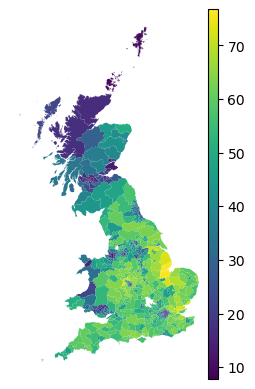

In [76]:
fig, ax = plt.subplots(1,1)
ax.set_axis_off()
divider = make_axes_locatable(ax)
cax = divider.append_axes("right",size="5%", pad=0.0)
uk_results.plot(column="Con19",ax=ax,legend=True,cax=cax)
plt.show()

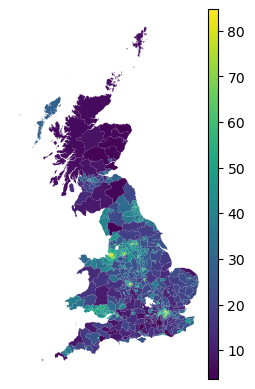

In [48]:
fig, ax = plt.subplots(1,1)
ax.set_axis_off()
divider = make_axes_locatable(ax)
cax = divider.append_axes("right",size="5%", pad=0.0)
uk_results.plot(column="Lab19",ax=ax,legend=True,cax=cax)
plt.show()

To represent the Brexit Referendum results let us also plot Leave and Remain

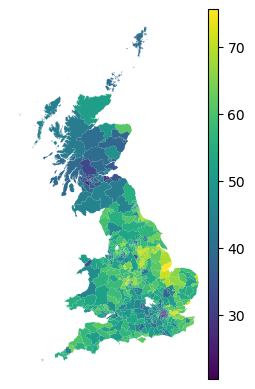

In [68]:
fig, ax = plt.subplots(1,1)
ax.set_axis_off()
divider = make_axes_locatable(ax)
cax = divider.append_axes("right",size="5%", pad=0.0)
uk_results.plot(column="Leave",ax=ax,legend=True,cax=cax)
plt.show()

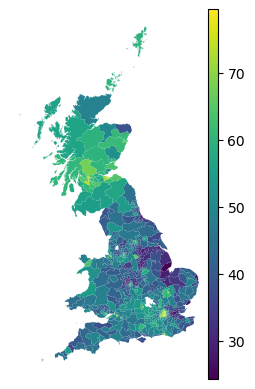

In [69]:
fig, ax = plt.subplots(1,1)
ax.set_axis_off()
divider = make_axes_locatable(ax)
cax = divider.append_axes("right",size="5%", pad=0.0)
uk_results.plot(column="Remain",ax=ax,legend=True,cax=cax)
plt.show()

# Summary Statistics 

In previous chapters we have developed a loop approach to constructing the summary statistics. In Chapter 7 we have also seen how to output the created summary statistics to LaTeX. As the book is written in LaTeX, the output code is included here too.

Our first example will just use the 2019 election results, Leave vote and 1 variable from each of the questions. We may readily extend this list of variables by adding code

In [96]:
df2 = uk_results[['Con19','Lab19','Leave','hc1','oc1','ca1','ns1','he1','qu1','de1']]

Next we create a blank data frame to hold the summary statistics

In [97]:
sdep = pd.DataFrame(columns=['Var', 'Mean', 'SD','Min','q25','q50','q75','Max'], index=range(df2.shape[1]))

Now let us run the loop developed in earlier classes to generate summary statistics for these variables

In [113]:
for i in range(df2.shape[1]):
  sdep.loc[i,'Var'] = df2.columns[i]
  sdep.loc[i,'Mean'] = round(np.mean(df2.iloc[:,i]),3)
  sdep.loc[i,'SD'] = round(statistics.stdev(df2.iloc[:,i]),3)
  sdep.loc[i,'Min'] = round(min(df2.iloc[:,i]),3)
  sdep.loc[i,'q25'] = round(np.quantile(df2.iloc[:,i],0.25),3)
  sdep.loc[i,'q50'] = round(np.quantile(df2.iloc[:,i],0.50),3)
  sdep.loc[i,'q75'] = round(np.quantile(df2.iloc[:,i],0.75),3)
  sdep.loc[i,'Max'] = round(max(df2.iloc[:,i]),3)


sdep.head()

,Var,Mean,SD,Min,q25,q50,q75,Max
0,Con19,43.987,16.729,7.818,30.942,47.55,58.495,76.724
1,Lab19,33.852,17.471,3.721,20.434,32.707,45.492,84.681
2,Leave,52.056,11.454,20.481,45.33,53.686,60.17,75.65
3,hc1,64.036,11.424,20.484,59.112,66.831,71.819,85.682
4,oc1,33.324,5.762,14.633,30.422,34.246,37.377,46.328


The next block of code creates a LaTeX file. You may choose to save sdep in a different way

In [114]:
lout = pd.DataFrame(columns=['outp'], index=range(sdep.shape[0]))

for i in range(df2.shape[1]):
    lout.loc[i,'outp'] = ["&" + str(sdep.loc[i,'Var']) + "&" + str(sdep.loc[i,'Mean']) + "&" + str(sdep.loc[i,'SD']) + "&"+ str(sdep.loc[i,'Min']) + "&" + str(sdep.loc[i,'q25']) + "&"+ str(sdep.loc[i,'q50']) +  "&" + str(sdep.loc[i,'q75']) + "&"+ str(sdep.loc[i,'Max']) + "&"+"\\"]
                     
lout.to_csv('summaryd.txt', sep='\t', index=False)

lout.head()  


,outp
0,[&Con19&43.987&16.729&7.818&30.942&47.55&58.49...
1,[&Lab19&33.852&17.471&3.721&20.434&32.707&45.4...
2,[&Leave&52.056&11.454&20.481&45.33&53.686&60.1...
3,[&hc1&64.036&11.424&20.484&59.112&66.831&71.81...
4,[&oc1&33.324&5.762&14.633&30.422&34.246&37.377...


We also produce a correlation matrix and then output it to LaTeX. Because of the print() command we are able to see the correlation matrix produced within the window.

In [112]:
Corr_Matrix = round(df2.corr(),3)
print(Corr_Matrix)

lout = pd.DataFrame(columns=['outp'], index=range(Corr_Matrix.shape[0]))

for i in range(Corr_Matrix.shape[1]):
    lout.loc[i,'outp'] = ["&" + str(Corr_Matrix.iloc[i,0])+"&" + str(Corr_Matrix.iloc[i,1]) + "&" + str(Corr_Matrix.iloc[i,2])+ "&" + str(Corr_Matrix.iloc[i,3])+ "&" + str(Corr_Matrix.iloc[i,4])+ "&" + str(Corr_Matrix.iloc[i,5])+ "&" + str(Corr_Matrix.iloc[i,6])+ "&" + str(Corr_Matrix.iloc[i,7])+ "&" + str(Corr_Matrix.iloc[i,8])+ "&" + str(Corr_Matrix.iloc[i,9])+ "&" + str(Corr_Matrix.iloc[i,10])]
    
lout.to_csv('corrd.txt', sep='\t', index=False)

Corr_Matrix.shape[1]

       Con19  Lab19  Leave    hc1    oc1    ca1    ns1    he1    qu1    de1  \
Con19  1.000 -0.620  0.601  0.652  0.637 -0.736  0.367 -0.260 -0.107  0.468   
Lab19 -0.620  1.000 -0.153 -0.625 -0.619  0.695 -0.493 -0.190 -0.007 -0.586   
Leave  0.601 -0.153  1.000  0.435  0.347 -0.397 -0.390 -0.783  0.474 -0.216   
hc1    0.652 -0.625  0.435  1.000  0.861 -0.912  0.337 -0.123  0.074  0.555   
oc1    0.637 -0.619  0.347  0.861  1.000 -0.900  0.411  0.058 -0.018  0.608   
ca1   -0.736  0.695 -0.397 -0.912 -0.900  1.000 -0.431  0.027  0.062 -0.661   
ns1    0.367 -0.493 -0.390  0.337  0.411 -0.431  1.000  0.576 -0.733  0.827   
he1   -0.260 -0.190 -0.783 -0.123  0.058  0.027  0.576  1.000 -0.510  0.553   
qu1   -0.107 -0.007  0.474  0.074 -0.018  0.062 -0.733 -0.510  1.000 -0.625   
de1    0.468 -0.586 -0.216  0.555  0.608 -0.661  0.827  0.553 -0.625  1.000   
lc     0.527 -0.097  0.815  0.347  0.253 -0.311 -0.274 -0.657  0.306 -0.144   

          lc  
Con19  0.527  
Lab19 -0.097  
Leave 

11

We will also make a dummy variable which reports whether the Conservatives scored a greater vote than Labour in the 2019 election

In [132]:
df2["conlab19"] = (df2["Con19"]>df2["Lab19"])*1

/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2728547249.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2["conlab19"] = (df2["Con19"]>df2["Lab19"])*1


As well as a dummy variable for constituencies where the Leave vote was higher than the remain vote

In [102]:
df2["lc"] = (df2["Leave"]>50)*1

/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/100670055.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2["lc"] = (df2["Leave"]>50)*1


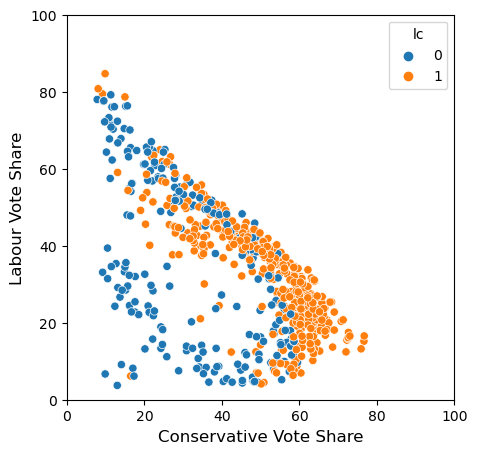

In [105]:
fig, ax = plt.subplots(figsize = ( 5 , 5 )) 
sb.scatterplot( ax = ax , x = df2['Con19'] , y = df2['Lab19'] , data = df2 , hue=df2['lc']) 

ax.set_xlabel( "Conservative Vote Share" , size = 12 ) 
ax.set_ylabel( "Labour Vote Share" , size = 12 ) 

ax.set_xlim(0,100)
ax.set_ylim(0,100)
 
plt.show()

Now let us simply consider whether the Conservatives performed better than Labour in a given constituency. We created a dummy for this purpose. Hence, let us use the dummy to create a Seaborn pairplot

In [134]:
df3 = df2[['hc1','oc1','ca1','ns1','he1','qu1','de1','conlab19']]

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


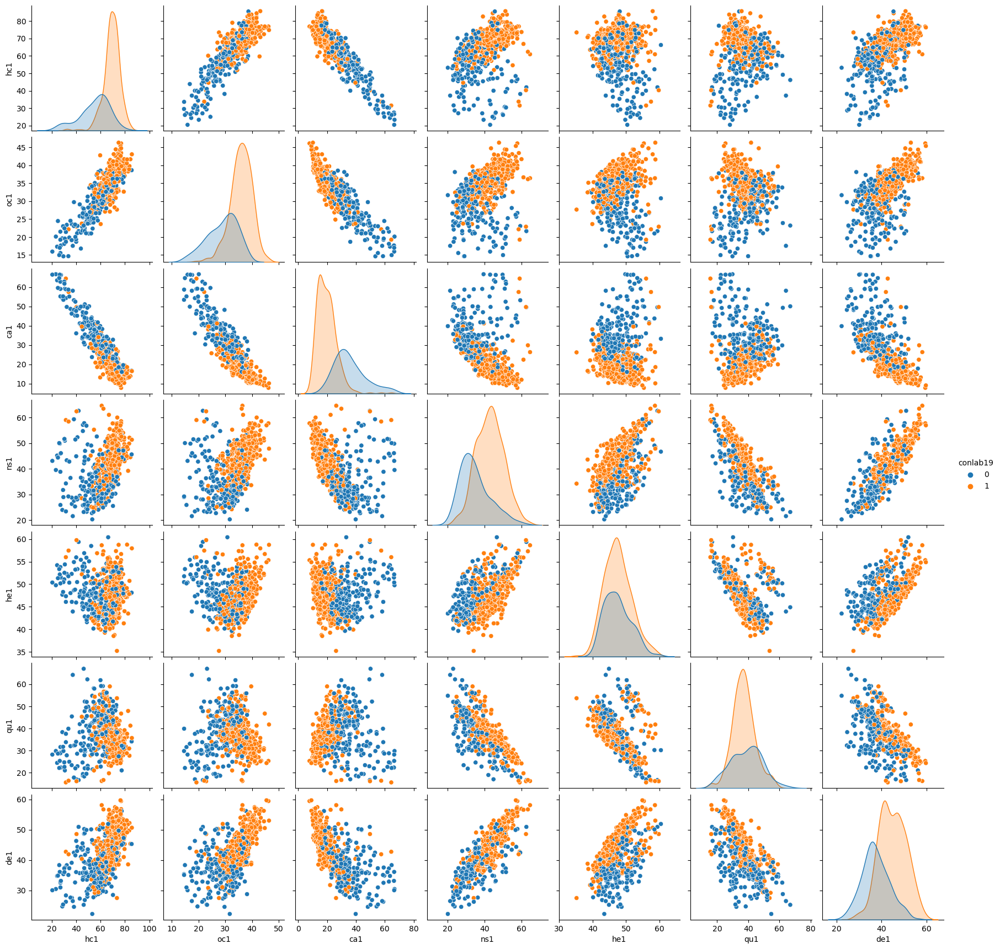

In [135]:
sb.pairplot(df3,hue='conlab19')

Let us consider some of the subplots within this set to see more about voting patterns

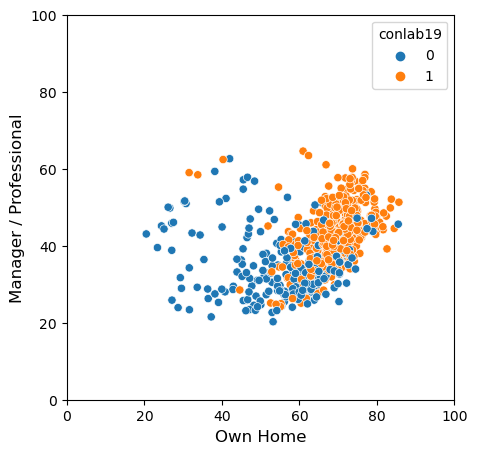

In [136]:
fig, ax = plt.subplots(figsize = ( 5 , 5 )) 
sb.scatterplot( ax = ax , x = df2['hc1'] , y = df2['ns1'] , data = df2 , hue=df2['conlab19']) 

ax.set_xlabel( "Own Home" , size = 12 ) 
ax.set_ylabel( "Manager / Professional" , size = 12 ) 

ax.set_xlim(0,100)
ax.set_ylim(0,100)
 
plt.show()

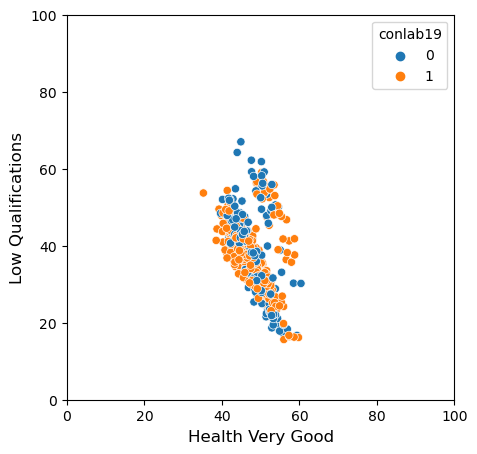

In [137]:
fig, ax = plt.subplots(figsize = ( 5 , 5 )) 
sb.scatterplot( ax = ax , x = df2['he1'] , y = df2['qu1'] , data = df2 , hue=df2['conlab19']) 

ax.set_xlabel( "Health Very Good" , size = 12 ) 
ax.set_ylabel( "Low Qualifications" , size = 12 ) 

ax.set_xlim(0,100)
ax.set_ylim(0,100)
 
plt.show()

It is also possible to view the distributions closer with the code from Chapter 4

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


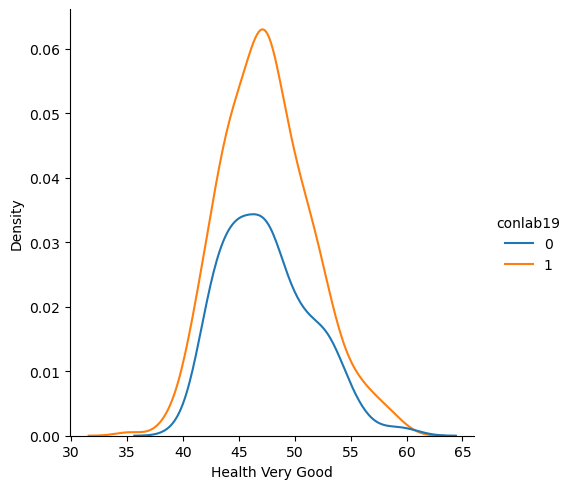

In [140]:
ax = sb.displot(df2, x='he1',hue="conlab19", kind="kde")
ax.set(xlabel='Health Very Good', ylabel='Density')
plt.show()

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


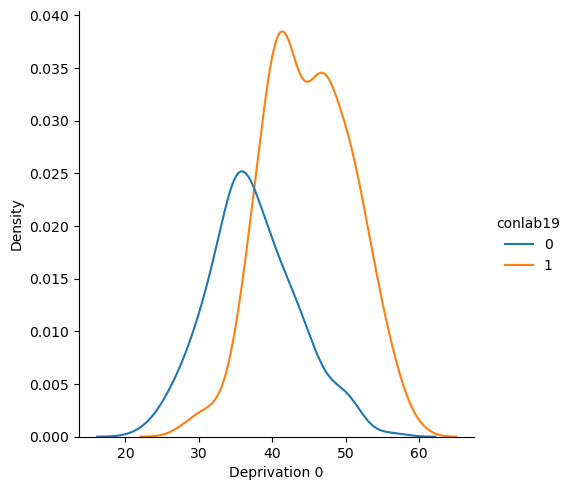

In [141]:
ax = sb.displot(df2, x='de1',hue="conlab19", kind="kde")
ax.set(xlabel='Deprivation 0', ylabel='Density')
plt.show()

We may also look at Brexit voting patterns

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


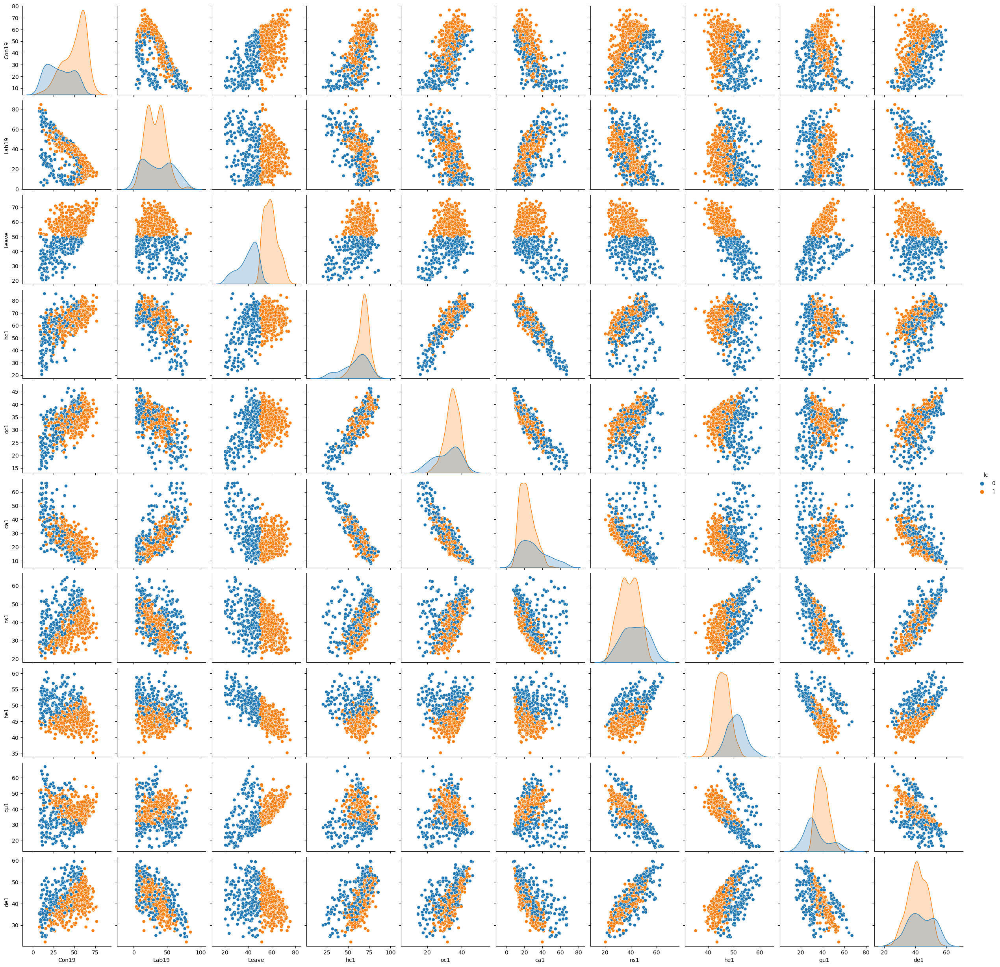

In [126]:
sb.pairplot(df2,hue='lc')

Let us make a smaller pairplot based only on the census variables

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


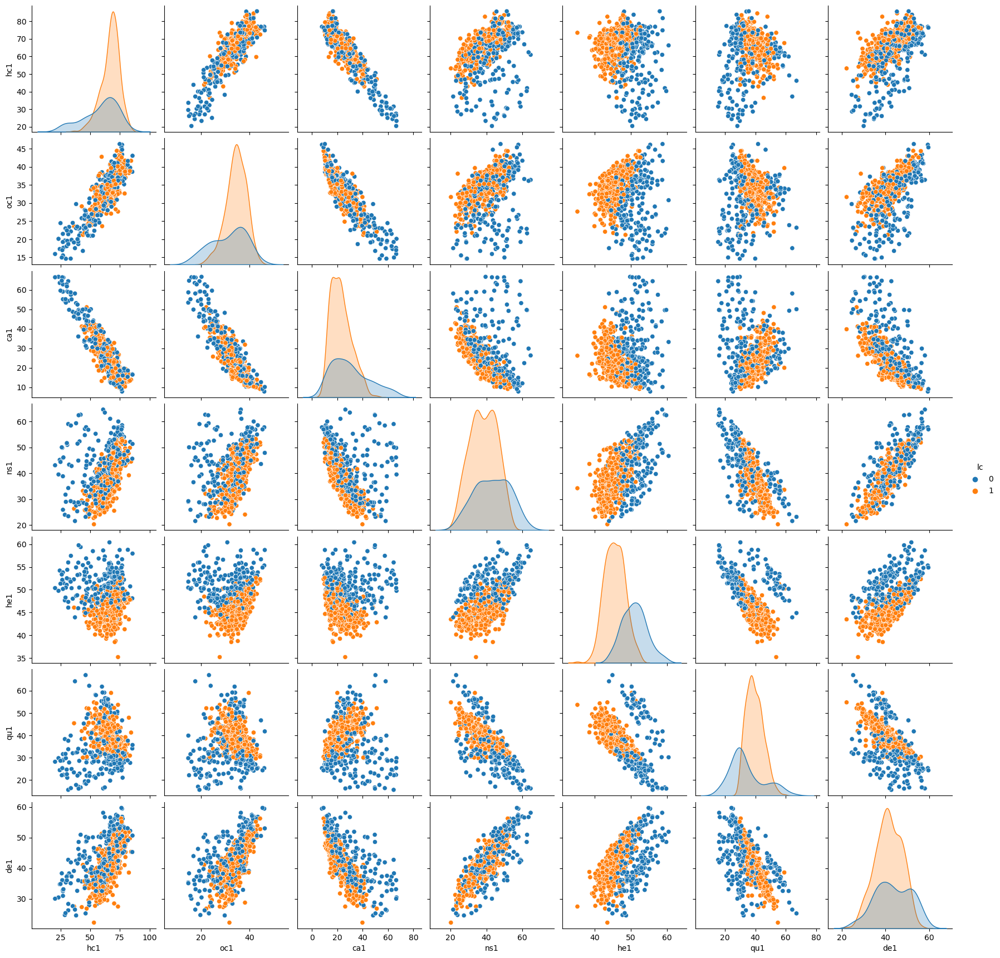

In [129]:
df3 = df2[['hc1','oc1','ca1','ns1','he1','qu1','de1','lc']]

sb.pairplot(df3,hue='lc')

Then let us make a second pairplot with just the two vote counts

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


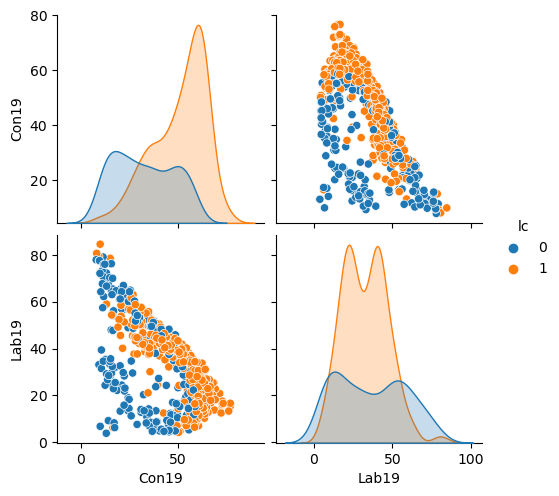

In [130]:
df4 = df2[['Con19','Lab19','lc']]

sb.pairplot(df4,hue='lc')

# BallMapper Plots

Our first TDABM plots will consider Brexit as we can compare neatly with the scatter plot in the previous section. Our plots consider the Conservative and Labour votes in the 2019 General Election.

As a colouration variable we can use the Leave dummy lc

In [121]:
cdf = pd.DataFrame(df2['lc'])
adf = pd.DataFrame(df2[['Con19','Lab19']])
bm1=pbm.BallMapper(X=adf, eps=10, coloring_df=cdf)

<Axes: >

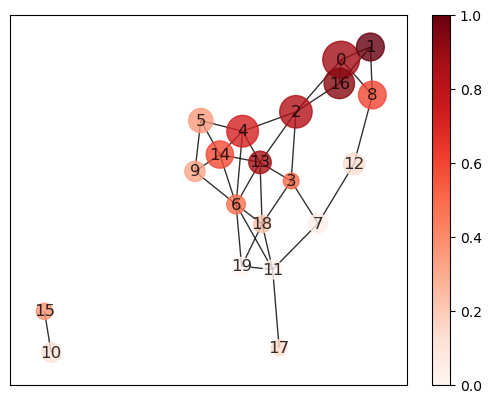

In [122]:
bm1.draw_networkx(coloring_variable='lc', colorbar=True)

We then create two further TDABM plots where the colouration variable is the vote for the Conservatives and Labour

<Axes: >

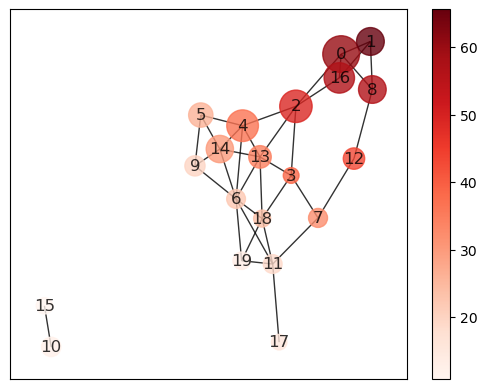

In [124]:
cdf = pd.DataFrame(df2['Con19'])
adf = pd.DataFrame(df2[['Con19','Lab19']])
bm1=pbm.BallMapper(X=adf, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', colorbar=True)

<Axes: >

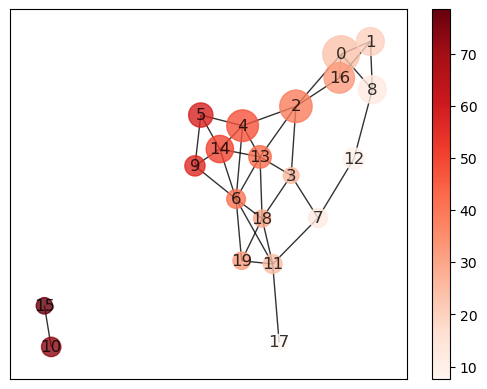

In [125]:
cdf = pd.DataFrame(df2['Lab19'])
adf = pd.DataFrame(df2[['Con19','Lab19']])
bm1=pbm.BallMapper(X=adf, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Lab19', colorbar=True)

Our next TDABM plot will take the Census 2011 variables as the axes and then consider the different colouration options. 

To do this we will need a new data frame with just the axis variables

In [142]:
bmx1 = df2[['hc1','oc1','ca1','ns1','he1','qu1','de1']]

For the first colouration variable we will take the Conservative vote in 2019

In [143]:
cdf = pd.DataFrame(df2['Con19'])

We may now generate the TDABM plots for this data and plot

<Axes: >

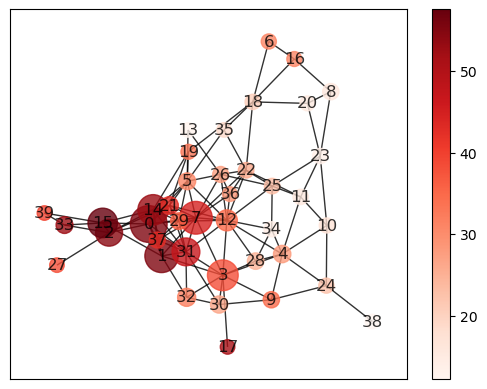

In [146]:
bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', colorbar=True)

Let us make the same TDABM plot with Labour 2019 vote as the colouration variable

<Axes: >

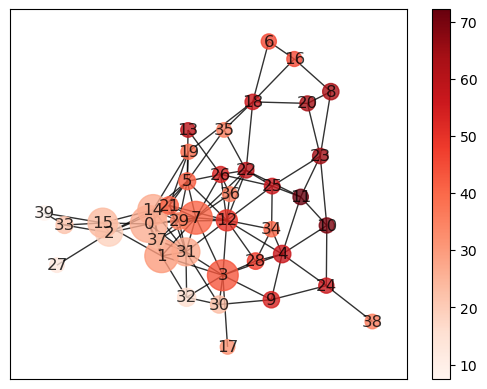

In [168]:
cdf = pd.DataFrame(df2['Lab19'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Lab19', colorbar=True)

To use a new palette we can import the desired palette using the colormap package

In [161]:
hsvp = cm.get_cmap("gist_rainbow")

<Axes: >

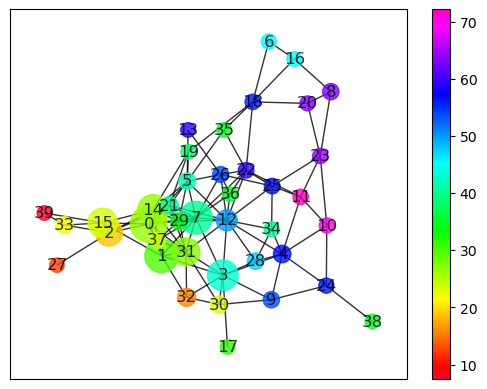

In [169]:
bm1.draw_networkx(coloring_variable='Lab19', color_palette=hsvp, colorbar=True)

We will also redo the Conservative 2019 voting using the hsv color map

<Axes: >

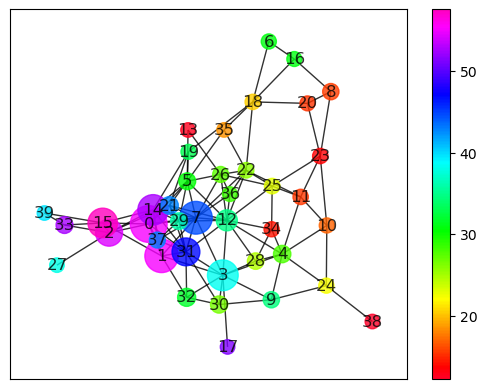

In [163]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

We also produce plots which are coloured according to the axis variables. We have one block of code for each axis here

<Axes: >

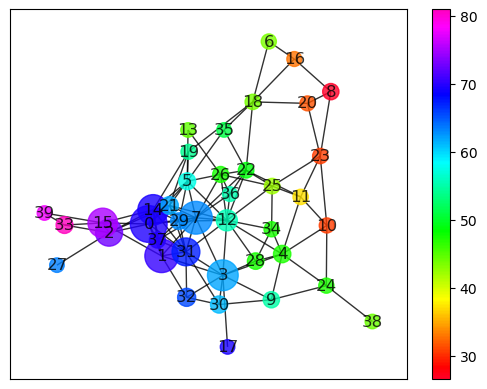

In [164]:
cdf = pd.DataFrame(bmx1['hc1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='hc1', color_palette=hsvp, colorbar=True)

<Axes: >

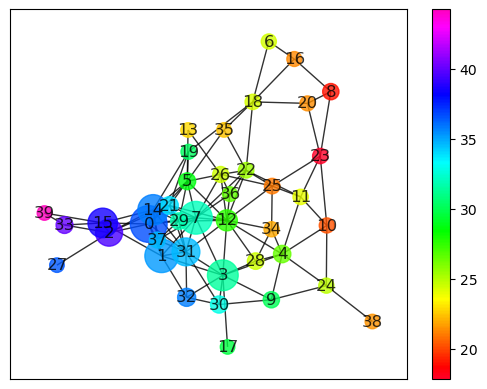

In [165]:
cdf = pd.DataFrame(bmx1['oc1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='oc1', color_palette=hsvp, colorbar=True)

<Axes: >

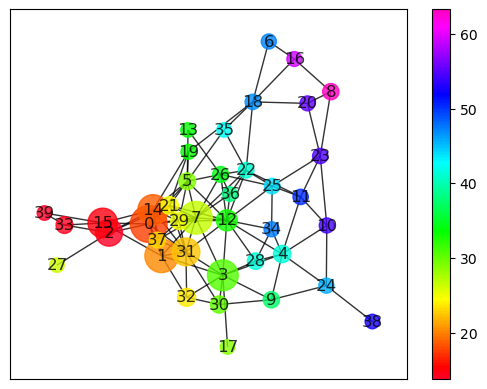

In [166]:
cdf = pd.DataFrame(bmx1['ca1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='ca1', color_palette=hsvp, colorbar=True)

<Axes: >

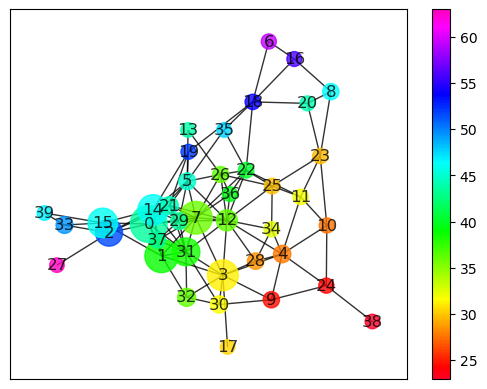

In [167]:
cdf = pd.DataFrame(bmx1['ns1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='ns1', color_palette=hsvp, colorbar=True)

<Axes: >

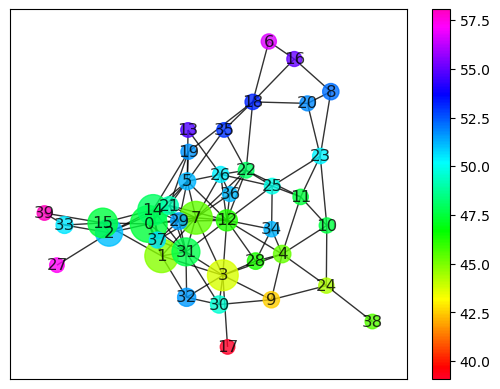

In [190]:
cdf = pd.DataFrame(bmx1['he1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='he1', color_palette=hsvp, colorbar=True)

<Axes: >

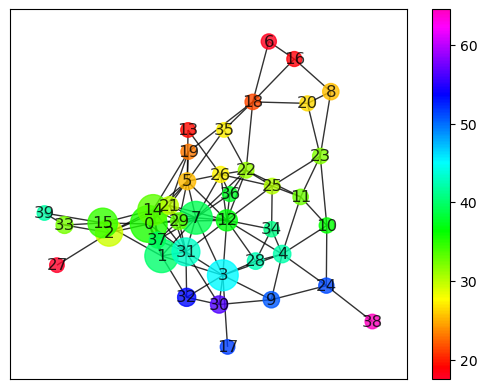

In [191]:
cdf = pd.DataFrame(bmx1['qu1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='qu1', color_palette=hsvp, colorbar=True)

<Axes: >

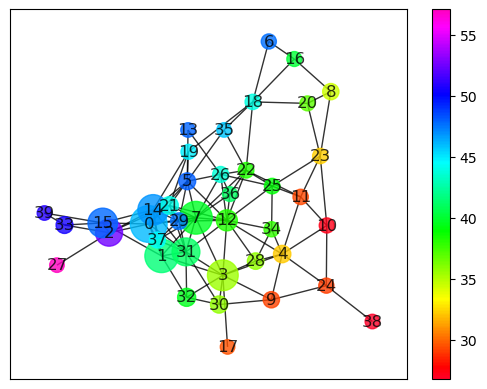

In [192]:
cdf = pd.DataFrame(bmx1['de1'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='de1', color_palette=hsvp, colorbar=True)

In TDABM plots the radius is an important conisderation. Let us try some further values to show the effect. For these plots we will use the Conservative vote in 2019 as the colouration

<Axes: >

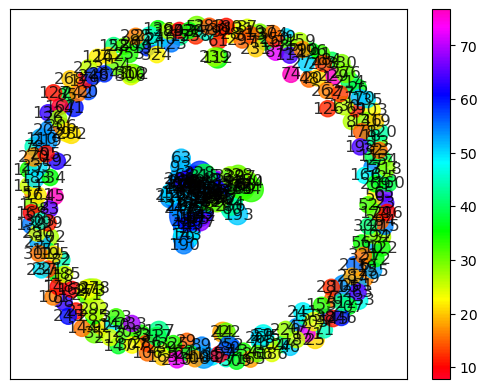

In [195]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=5, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

<Axes: >

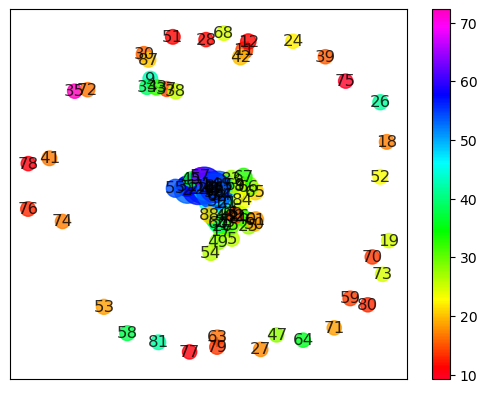

In [196]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=10, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

<Axes: >

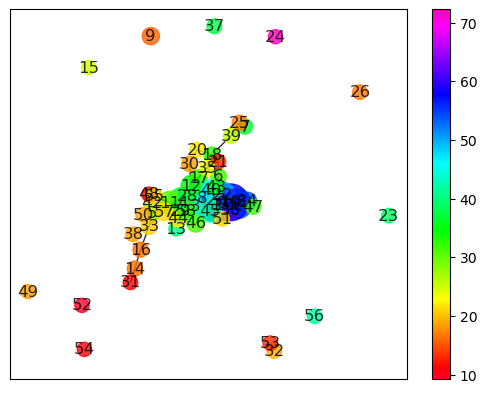

In [197]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=12, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

<Axes: >

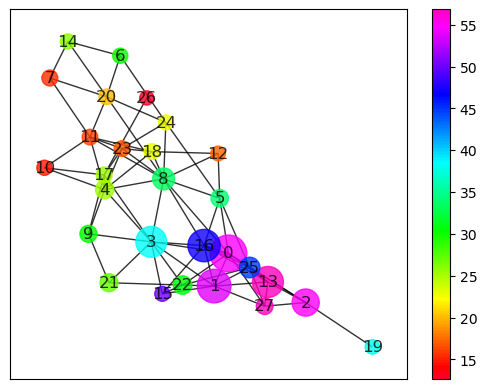

In [198]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=16, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

<Axes: >

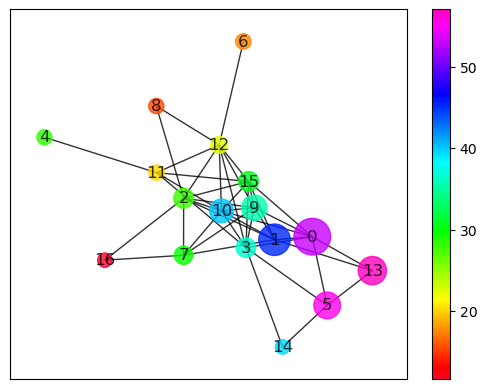

In [199]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=20, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

<Axes: >

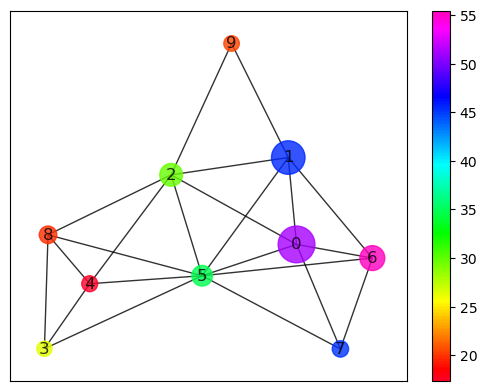

In [200]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=25, coloring_df=cdf)

bm1.draw_networkx(coloring_variable='Con19', color_palette=hsvp, colorbar=True)

# Functions with TDABM Plots

To ensure that we are working with the main plot we will run the TDABM command again with Con19 as the colouring variable. 

In [201]:
cdf = pd.DataFrame(df2['Con19'])

bm1=pbm.BallMapper(X=bmx1, eps=14, coloring_df=cdf)

We are now confident that the object bm1 is the TDABM graph we wish to interrogate. The first function we will look at is points_and_balls()

The function produces a list of the points which sit within each of the balls of our TDABM plot. 

In [193]:
pb1 = bm1.points_and_balls()

We can see the output of the function by looking at the head() of its output

In [202]:
pb1.head()

,point,ball
0,0,0
1,6,0
2,8,0
3,9,0
4,14,0


point is the index number of the data set and the ball number then corresponds to the plot. Python gives us a ball 0, users of R will find that the first ball is numbered 1. The 0 is kept because it corresponds with the indexing in a standard Python data frame.

We will merge our balls list with the large version of the data frame uk_results. We need to first create a column for the index number of each row

In [210]:
uk_results['point'] = uk_results.index

We may then merge the uk_results data with the list of poinst in each ball

In [211]:
uk_results = uk_results.merge(pb1, on='point')

We can generate constituency lists for each ball in a csv file. Given that some balls contain 100+ constituencies, trying to ask Python to display the list is difficult.

In [213]:
uk_results2 = pd.DataFrame(uk_results[["ConstituencyName","Con19","Lab19","ball"]])

If we want to look at a particular ball then we can just subset within Python. Let us look at ball 8

In [331]:
uk_results08 = uk_results2[uk_results2["ball"] == 17]

To see the constituencies in the ball then we can simply ask Python to print

In [332]:
uk_results08['ConstituencyName']

240            Clacton
407     Great Yarmouth
1284           Rhondda
Name: ConstituencyName, dtype: object

We will save the uk_results2 data to a csv file so that it can be interrogated later. We use the 14 to denote the fact that the radius used in the plot was 14

In [223]:
uk_results2.to_csv("balls14.csv")

We are also able to generate maps of the locations of all of the balls. We will show an example with ball 15 and then set a loop to obtain the other balls.

The first step is to generate a dummy variable which can be used to colour the map

In [319]:
uk_results['ball15'] = (uk_results['ball']==2)*1

We can check that we are happy with the dummy by using the describe() function

In [315]:
uk_results['ball15'].describe()

count    1346.000000
mean        0.002229
std         0.047175
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: ball15, dtype: float64

There are 1346 values since there are constituencies which appear in multiple balls. The mean of 0.0832 tells us that 8% of the combination of constituency-ball pairings observed are in ball 15. 

To plot the ball on the map we can simply use the same approach as we used earlier to plot the voting dummies. 

/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/754901787.py:6: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


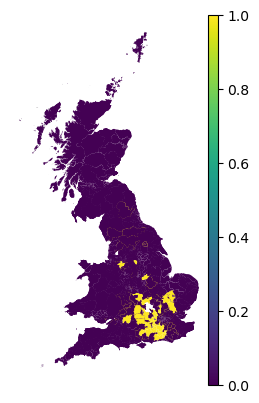

In [320]:
fig, ax = plt.subplots(1,1)
ax.set_axis_off()
divider = make_axes_locatable(ax)
cax = divider.append_axes("right",size="5%", pad=0.0)
uk_results.plot(column="ball15",ax=ax,legend=True,cax=cax)
fig.show()

We may generate a loop for the remaining balls. In this case we will first identify the highest ball number and then loop over the range of i between 0 and the highest number. We will have a single dummy which will get overwritten on each run of the loop

In [228]:
a001 = max(uk_results['ball'])

/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2

/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2025289700.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/var/folders/d_/klkd7_491tg0b3kbyw264d940000gn/T/ipykernel_655/2

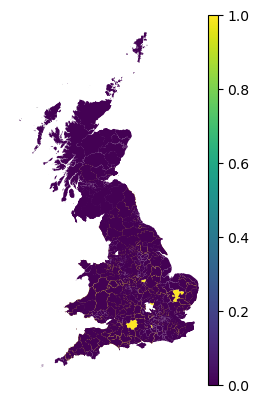

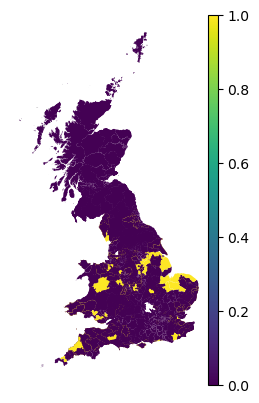

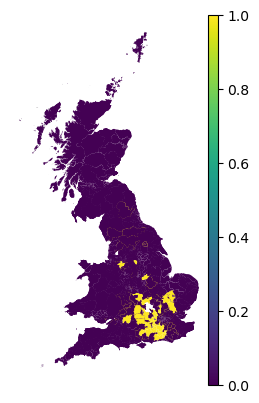

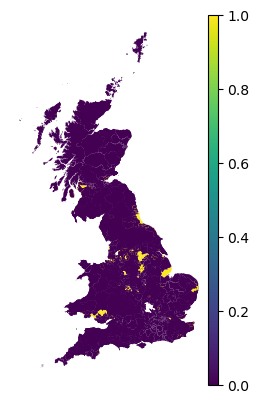

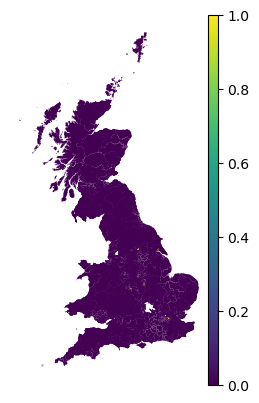

...

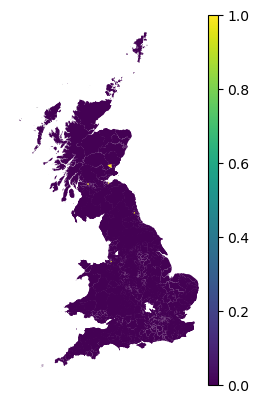

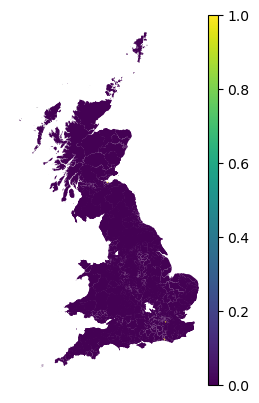

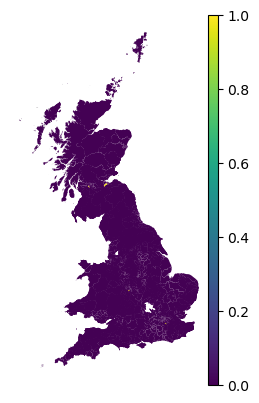

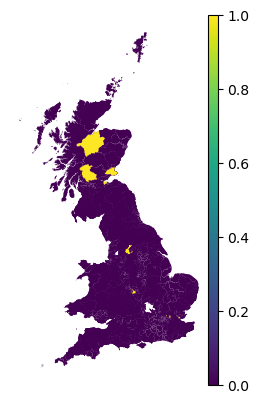

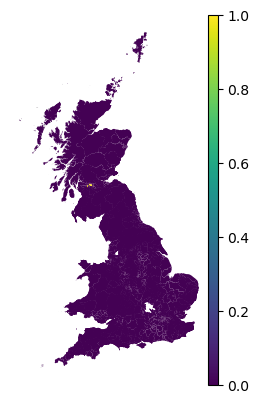

In [246]:
for i in range(0,a001):
    uk_results['balld'] = (uk_results['ball']==i)*1
    fig, ax = plt.subplots(1,1)
    ax.set_axis_off()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right",size="5%", pad=0.0)
    uk_results.plot(column="balld",ax=ax,legend=True,cax=cax)
    fig.show()
    filename = ["ballmap" + str(i) + ".png"] 
    fig.savefig(str(filename[0]))

# Summary Statistics for Balls

We will now construct summary statistics for the balls in our TDABM plot. We will focus on the average values in the summary statistics

In [253]:
uk_results.groupby('ball').agg(
    # Get max of the duration column for each group
    max_duration=('hc1', mean),
    # Get min of the duration column for each group
    min_duration=('oc1', mean),
    # Get sum of the duration column for each group
    total_duration=('ca1', mean))


NameError: name 'mean' is not defined

In [276]:
conmean = uk_results.groupby('ball')['Con19'].mean() 
hc1m = uk_results.groupby('ball')['hc1'].mean()
oc1m = uk_results.groupby('ball')['oc1'].mean()
ns1m = uk_results.groupby('ball')['ns1'].mean()
he1m = uk_results.groupby('ball')['he1'].mean()
qu1m = uk_results.groupby('ball')['qu1'].mean()
de1m = uk_results.groupby('ball')['de1'].mean()
ballm = uk_results.groupby('ball')['point'].mean()

ballmeans = pd.DataFrame([conmean,hc1m,oc1m,ns1m,he1m,qu1m,de1m])
ballmeans = ballmeans.transpose()

In [277]:
ballmeans.head()

,Con19,hc1,oc1,ns1,he1,qu1,de1
ball,,,,,,,
0,55.079848,69.642337,36.652554,43.565018,47.531073,35.365155,46.049755
1,55.234829,70.464466,35.262508,38.814018,44.854878,40.029589,41.592634
2,54.358593,72.881441,39.546786,51.705769,51.087381,29.353661,52.553451
3,38.418607,61.991416,31.401328,31.100169,43.680906,45.221777,35.485807
4,27.865309,47.366873,26.446390,27.737361,45.308426,42.261635,32.244252


In [281]:
lout = pd.DataFrame(columns=['outp'], index=range(ballmeans.shape[0]))

for i in range(ballmeans.shape[0]):
    lout.loc[i,'outp'] = ["&" + str(round(ballmeans.iloc[i,0],2))+"&" +  str(round(ballmeans.iloc[i,1],2)) + "&"  + str(round(ballmeans.iloc[i,2],2)) + "&"  + str(round(ballmeans.iloc[i,3],2))+ "&"  + str(round(ballmeans.iloc[i,4],2))+ "&"  + str(round(ballmeans.iloc[i,5],2))+ "&"  + str(round(ballmeans.iloc[i,6],2))]
    
lout.to_csv('ballmeans14.txt', sep='\t', index=False)

lout.head() 

,outp
0,[&55.08&69.64&36.65&43.57&47.53&35.37&46.05]
1,[&55.23&70.46&35.26&38.81&44.85&40.03&41.59]
2,[&54.36&72.88&39.55&51.71&51.09&29.35&52.55]
3,[&38.42&61.99&31.4&31.1&43.68&45.22&35.49]
4,[&27.87&47.37&26.45&27.74&45.31&42.26&32.24]


The analysis raises questions about Ball 39. Let us look at the members

In [283]:
uk_results39 = uk_results2[uk_results2["ball"] == 39]
uk_results39['ConstituencyName']

1196                    East Renfrewshire
1217                               Gordon
1258    West Aberdeenshire and Kincardine
Name: ConstituencyName, dtype: object

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


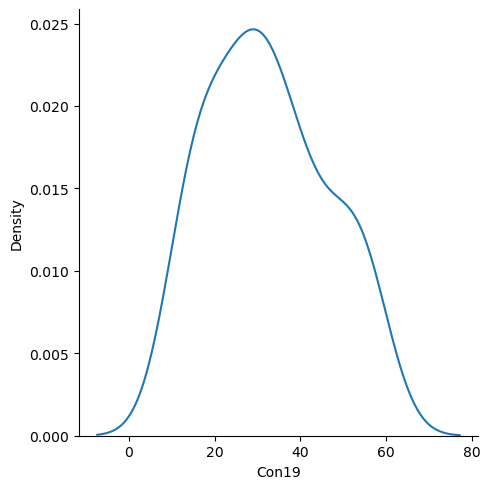

In [286]:
sb.displot(ballmeans['Con19'],kind="kde")

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


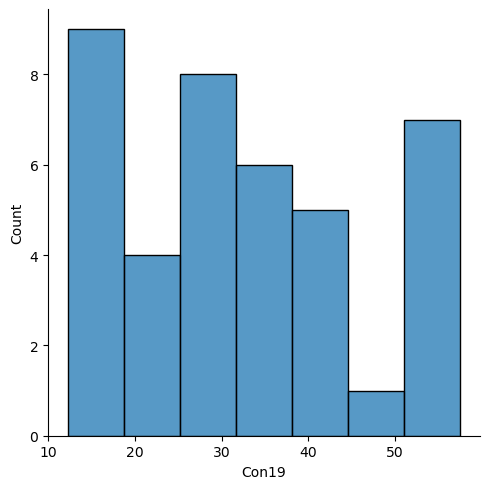

In [287]:
sb.displot(ballmeans['Con19'])

# K-means Clustering

For clustering we need a dataset which only contains the axis variables

In [289]:
kmeans_data = df2[['hc1','oc1','ca1','ns1','he1','qu1','de1']]

We will cluster the data into clusters using kmeans. We produce cases with between 2 and 40 clusters

In [301]:
from sklearn.cluster import KMeans
X = kmeans_data
kmeans2 = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
kmeans3 = KMeans(n_clusters=3, random_state=0, n_init="auto").fit(X)
kmeans4 = KMeans(n_clusters=4, random_state=0, n_init="auto").fit(X)
kmeans5 = KMeans(n_clusters=5, random_state=0, n_init="auto").fit(X)
kmeans6 = KMeans(n_clusters=6, random_state=0, n_init="auto").fit(X)
kmeans7 = KMeans(n_clusters=7, random_state=0, n_init="auto").fit(X)
kmeans8 = KMeans(n_clusters=8, random_state=0, n_init="auto").fit(X)
kmeans9 = KMeans(n_clusters=9, random_state=0, n_init="auto").fit(X)
kmeans10 = KMeans(n_clusters=10, random_state=0, n_init="auto").fit(X)
kmeans11 = KMeans(n_clusters=11, random_state=0, n_init="auto").fit(X)
kmeans12 = KMeans(n_clusters=12, random_state=0, n_init="auto").fit(X)
kmeans13 = KMeans(n_clusters=13, random_state=0, n_init="auto").fit(X)
kmeans14 = KMeans(n_clusters=14, random_state=0, n_init="auto").fit(X)
kmeans15 = KMeans(n_clusters=15, random_state=0, n_init="auto").fit(X)
kmeans16 = KMeans(n_clusters=16, random_state=0, n_init="auto").fit(X)
kmeans17 = KMeans(n_clusters=17, random_state=0, n_init="auto").fit(X)
kmeans18 = KMeans(n_clusters=18, random_state=0, n_init="auto").fit(X)
kmeans19 = KMeans(n_clusters=19, random_state=0, n_init="auto").fit(X)
kmeans20 = KMeans(n_clusters=20, random_state=0, n_init="auto").fit(X)
kmeans21 = KMeans(n_clusters=21, random_state=0, n_init="auto").fit(X)
kmeans22 = KMeans(n_clusters=22, random_state=0, n_init="auto").fit(X)
kmeans23 = KMeans(n_clusters=23, random_state=0, n_init="auto").fit(X)
kmeans24 = KMeans(n_clusters=24, random_state=0, n_init="auto").fit(X)
kmeans25 = KMeans(n_clusters=25, random_state=0, n_init="auto").fit(X)
kmeans26 = KMeans(n_clusters=26, random_state=0, n_init="auto").fit(X)
kmeans27 = KMeans(n_clusters=27, random_state=0, n_init="auto").fit(X)
kmeans28 = KMeans(n_clusters=28, random_state=0, n_init="auto").fit(X)
kmeans29 = KMeans(n_clusters=29, random_state=0, n_init="auto").fit(X)
kmeans30 = KMeans(n_clusters=30, random_state=0, n_init="auto").fit(X)
kmeans31 = KMeans(n_clusters=31, random_state=0, n_init="auto").fit(X)
kmeans32 = KMeans(n_clusters=32, random_state=0, n_init="auto").fit(X)
kmeans33 = KMeans(n_clusters=33, random_state=0, n_init="auto").fit(X)
kmeans34 = KMeans(n_clusters=34, random_state=0, n_init="auto").fit(X)
kmeans35 = KMeans(n_clusters=35, random_state=0, n_init="auto").fit(X)
kmeans36 = KMeans(n_clusters=36, random_state=0, n_init="auto").fit(X)
kmeans37 = KMeans(n_clusters=37, random_state=0, n_init="auto").fit(X)
kmeans38 = KMeans(n_clusters=38, random_state=0, n_init="auto").fit(X)
kmeans39 = KMeans(n_clusters=39, random_state=0, n_init="auto").fit(X)
kmeans40 = KMeans(n_clusters=40, random_state=0, n_init="auto").fit(X)
df3 = df2
df3['kmeans2'] = kmeans2.labels_
df3['kmeans3'] = kmeans3.labels_
df3['kmeans4'] = kmeans4.labels_
df3['kmeans5'] = kmeans5.labels_
df3['kmeans6'] = kmeans6.labels_
df3['kmeans7'] = kmeans7.labels_
df3['kmeans8'] = kmeans8.labels_
df3['kmeans9'] = kmeans9.labels_
df3['kmeans10'] = kmeans10.labels_
df3['kmeans11'] = kmeans11.labels_
df3['kmeans12'] = kmeans12.labels_
df3['kmeans13'] = kmeans13.labels_
df3['kmeans14'] = kmeans14.labels_
df3['kmeans15'] = kmeans15.labels_
df3['kmeans16'] = kmeans16.labels_
df3['kmeans17'] = kmeans17.labels_
df3['kmeans18'] = kmeans18.labels_
df3['kmeans19'] = kmeans19.labels_
df3['kmeans20'] = kmeans20.labels_
df3['kmeans21'] = kmeans21.labels_
df3['kmeans22'] = kmeans22.labels_
df3['kmeans23'] = kmeans23.labels_
df3['kmeans24'] = kmeans24.labels_
df3['kmeans25'] = kmeans25.labels_
df3['kmeans26'] = kmeans26.labels_
df3['kmeans27'] = kmeans27.labels_
df3['kmeans28'] = kmeans28.labels_
df3['kmeans29'] = kmeans29.labels_
df3['kmeans30'] = kmeans30.labels_
df3['kmeans31'] = kmeans31.labels_
df3['kmeans32'] = kmeans32.labels_
df3['kmeans33'] = kmeans33.labels_
df3['kmeans34'] = kmeans34.labels_
df3['kmeans35'] = kmeans35.labels_
df3['kmeans36'] = kmeans36.labels_
df3['kmeans37'] = kmeans37.labels_
df3['kmeans38'] = kmeans38.labels_
df3['kmeans39'] = kmeans39.labels_
df3['kmeans40'] = kmeans40.labels_



We adopt a similar approach to the way in which we produced the Ball summaries to generate summaries of the k-means clustering with 40 clusters

In [321]:
conmean = df3.groupby('kmeans40')['Con19'].mean() 
hc1m = df3.groupby('kmeans40')['hc1'].mean()
oc1m = df3.groupby('kmeans40')['oc1'].mean()
ns1m = df3.groupby('kmeans40')['ns1'].mean()
he1m = df3.groupby('kmeans40')['he1'].mean()
qu1m = df3.groupby('kmeans40')['qu1'].mean()
de1m = df3.groupby('kmeans40')['de1'].mean()

km = pd.DataFrame([conmean,hc1m,oc1m,ns1m,he1m,qu1m,de1m])
km = km.transpose()

for i in range(km.shape[0]):
    lout.loc[i,'outp'] = ["&" + str(round(km.iloc[i,0],2))+"&" +  str(round(km.iloc[i,1],2)) + "&"  + str(round(km.iloc[i,2],2)) + "&"  + str(round(km.iloc[i,3],2))+ "&"  + str(round(km.iloc[i,4],2))+ "&"  + str(round(km.iloc[i,5],2))+ "&"  + str(round(km.iloc[i,6],2))]
    
lout.to_csv('kmeans40.txt', sep='\t', index=False)

To merge the two clustering types we will add a descriptor variable that says how the clusters are formed

In [322]:
km['ctype']="K-means"

In [323]:
ballmeans['ctype']="TDABM"

We may now combine the two clustering approaches

In [325]:
clustm = pd.concat([km,ballmeans])

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


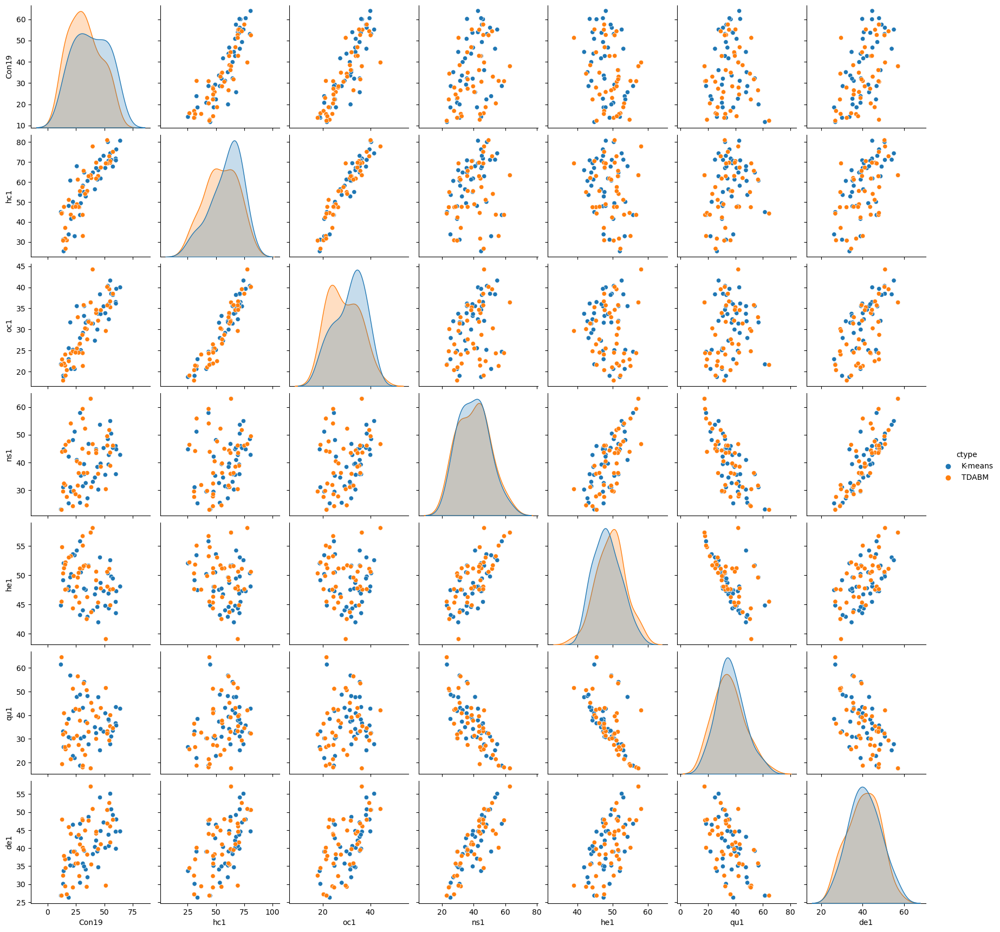

In [326]:
sb.pairplot(clustm,hue='ctype')

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


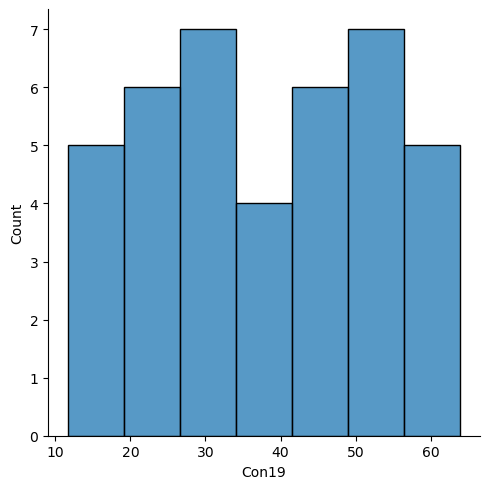

In [327]:
sb.displot(km['Con19'])

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default valu

/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/wanlingrudkin/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default valu

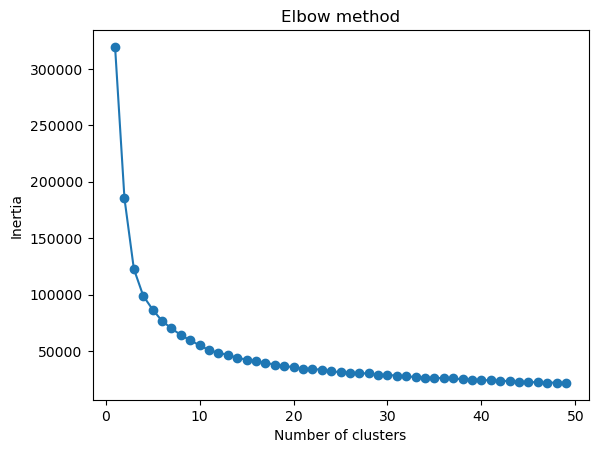

In [328]:
inertias = []

for i in range(1,50):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,50), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

It is hard to identify an elbow from the elbow plot. We may wish to go further to consider other methods for choosing the optimal clustering. However, it is clear from these plots that the 40 used in the TDABM is larger than would be selected for k-means